In [1]:
import sys
sys.path.append('F:\\pythonproject\\Tensor\\Chunk_v2\\')
import Chunk
print(Chunk.__file__)
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt

F:\pythonproject\Tensor\Chunk_v2\Chunk\__init__.py


In [2]:
fontsize = 16
plt.rcParams.update({
    'font.size': fontsize,
    'axes.titlesize': fontsize,
    'axes.labelsize': fontsize,
    'xtick.labelsize': fontsize,
    'ytick.labelsize': fontsize
})

In [3]:
expr_df = pd.read_csv('F:\\pythonproject\\Tensor\\Chunk_v2\\data\\OSSC\\TCGA-OSCC_tpm.csv', header=0, index_col=0).T #samples as rows and genes as columns

In [4]:
lr_expr_pairs, lr_expr_df = Chunk.filter_Bulkdata(expr_df,threshold=1,log=False)

In [5]:
clin_df = pd.read_csv('E:\\NMF\\TCGA-HNSC.clinical\\TCGA-OSCC_clinical.csv',index_col=0,header = 0)

In [6]:
df = clin_df[clin_df['tissue_type.samples'] != 'Normal']

df = df.dropna(subset=['ajcc_pathologic_stage.diagnoses'])

stage_mapping = {
    'Stage I': 1,
    'Stage IA': 1,
    'Stage II': 2,
    'Stage IIA': 2,
    'Stage IIB': 2,
    'Stage IIC': 2,
    'Stage III': 3,
    'Stage IIIA': 3,
    'Stage IIIB': 3,
    'Stage IIIC': 3,
    'Stage IV': 4,
    'Stage IVA': 4,
    'Stage IVB': 4
}

df['ajcc_pathologic_stage.diagnoses'] = df['ajcc_pathologic_stage.diagnoses'].map(stage_mapping)

In [7]:
S, Y, lr_expr_df, phenotype_interval, sorted_clin_df = Chunk.getOrderedConstraint(
    clin_df=df,
    lr_expr_df=lr_expr_df,
    by='ajcc_pathologic_stage.diagnoses',
)

In [8]:
comm_matrix2 = Chunk.build_communication_matrix(lr_expr_pairs, lr_expr_df)

In [9]:
optimal_K = Chunk.select_k_nmf(
    comm_matrix2.T.values.astype(float), S, k_max=20, repeat_times=5, verbose=True, 
    use_semi_supervised=True,
    semi_supervised_params={"alpha": 0.01, "beta": 0.01, "rho": 0.75}
)
print(f"Recommended K: {optimal_K}")

D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(


K=2, Reconstruction Error=293939.7188


D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of ite

K=3, Reconstruction Error=250206.2969


D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(


K=4, Reconstruction Error=221668.8438
K=4, eii=0.3949


D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(


K=5, Reconstruction Error=199771.5781
K=5, eii=0.2325


D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of ite

K=6, Reconstruction Error=188908.6750
K=6, eii=0.1034


D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of ite

K=7, Reconstruction Error=179046.3281
K=7, eii=0.0858


D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(


K=8, Reconstruction Error=169915.0125
K=8, eii=0.0736


D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of ite

K=9, Reconstruction Error=163175.7781
K=9, eii=0.0515


D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(
D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(


K=10, Reconstruction Error=158077.8312
K=10, eii=0.0375
Recommended K: 9


D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(


In [10]:
W, H, loss_history = Chunk.LRcommMining(X = comm_matrix2.T.values.astype(float), S=S, n_components=optimal_K, alpha=0.01, beta=0.01, rho=0.75, maxiter=4000, lr=0.001)

D:\python\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(


Iteration 0/4000, Loss: 163187.8594
Iteration 50/4000, Loss: 162908.8125
Iteration 100/4000, Loss: 162666.2656
Iteration 150/4000, Loss: 162455.3750
Iteration 200/4000, Loss: 162265.1719
Iteration 250/4000, Loss: 162091.8438
Iteration 300/4000, Loss: 161934.7500
Iteration 350/4000, Loss: 161792.5000
Iteration 400/4000, Loss: 161662.9688
Iteration 450/4000, Loss: 161543.4531
Iteration 500/4000, Loss: 161435.9688
Iteration 550/4000, Loss: 161338.7656
Iteration 600/4000, Loss: 161249.8125
Iteration 650/4000, Loss: 161169.9531
Iteration 700/4000, Loss: 161098.7031
Iteration 750/4000, Loss: 161033.6875
Iteration 800/4000, Loss: 160973.7656
Iteration 850/4000, Loss: 160917.6094
Iteration 900/4000, Loss: 160864.5000
Iteration 950/4000, Loss: 160814.5000
Iteration 1000/4000, Loss: 160766.3281
Iteration 1050/4000, Loss: 160720.5469
Iteration 1100/4000, Loss: 160677.1875
Iteration 1150/4000, Loss: 160640.6406
Iteration 1200/4000, Loss: 160608.1719
Iteration 1250/4000, Loss: 160580.6406
Iteration

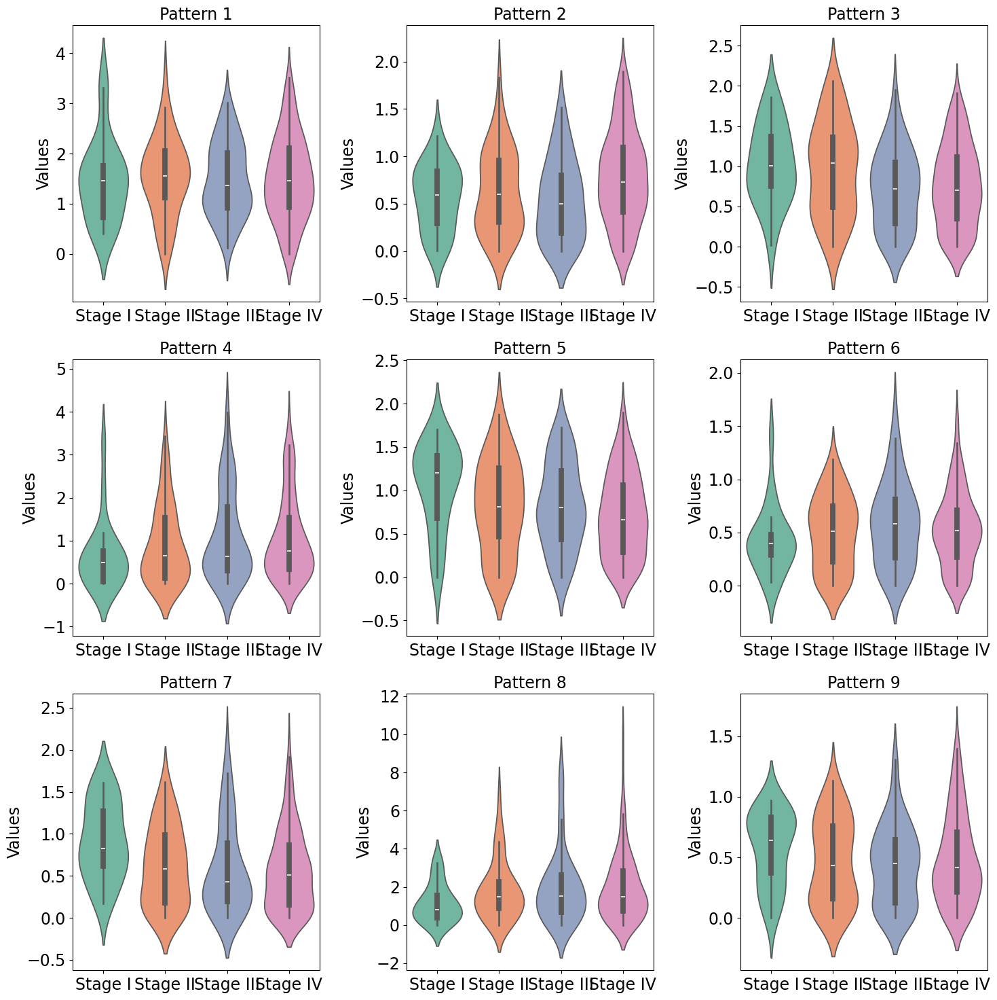

In [11]:
Chunk.getPatternDistribution(W, labels=['Stage I', 'Stage II', 'Stage III', 'Stage IV'], phenotype_interval = phenotype_interval,fontsize=17)

In [12]:
phenotype_types = {
    "ajcc_pathologic_stage.diagnoses": "ordinal",
}

result = Chunk.Singleassociationanalysis(W, sorted_clin_df, phenotype_types)

In [13]:
result

,Phenotype,Mode,Coefficient,P_value,R_squared,Adjusted_P_value
0,ajcc_pathologic_stage.diagnoses,Pattern_1,-0.006084,0.965735,None,0.965735
1,ajcc_pathologic_stage.diagnoses,Pattern_2,0.853342,0.000643,None,0.005786
2,ajcc_pathologic_stage.diagnoses,Pattern_3,-0.529806,0.013354,None,0.040061
3,ajcc_pathologic_stage.diagnoses,Pattern_4,0.172344,0.148255,None,0.266859
4,ajcc_pathologic_stage.diagnoses,Pattern_5,-0.594563,0.009043,None,0.040061
5,ajcc_pathologic_stage.diagnoses,Pattern_6,0.210782,0.495882,None,0.637563
6,ajcc_pathologic_stage.diagnoses,Pattern_7,-0.465525,0.039825,None,0.089607
7,ajcc_pathologic_stage.diagnoses,Pattern_8,0.085722,0.192997,None,0.289495
8,ajcc_pathologic_stage.diagnoses,Pattern_9,-0.045066,0.887271,None,0.965735


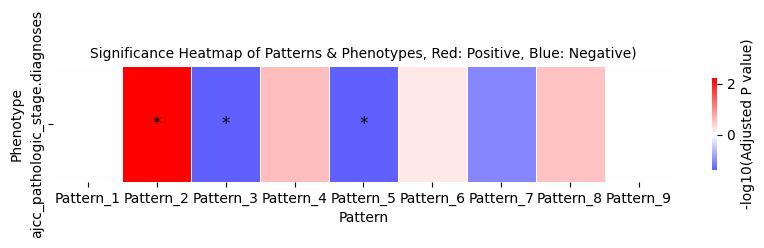

In [27]:
Chunk.plot_significance_heatmap(result, alpha = 0.05)

In [14]:
res = Chunk.getLRcomm(W,H,comm_matrix2,patterns = [2,4,8], lr_expr_pairs = lr_expr_pairs,zscore_threshold = 2.5)#47
res2 = Chunk.getLRcomm(W,H,comm_matrix2,patterns = [3,5,7], lr_expr_pairs = lr_expr_pairs,zscore_threshold = 3)#Specify to Early stage of tumor

In [15]:
Chunk.plot_sankey(res, title="Ligand-Receptor Interaction", width=800, height=1000,thickness=80,font_size=21)

C:\Users\Admin\AppData\Local\Temp\ipykernel_3844\3677853457.py:30: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




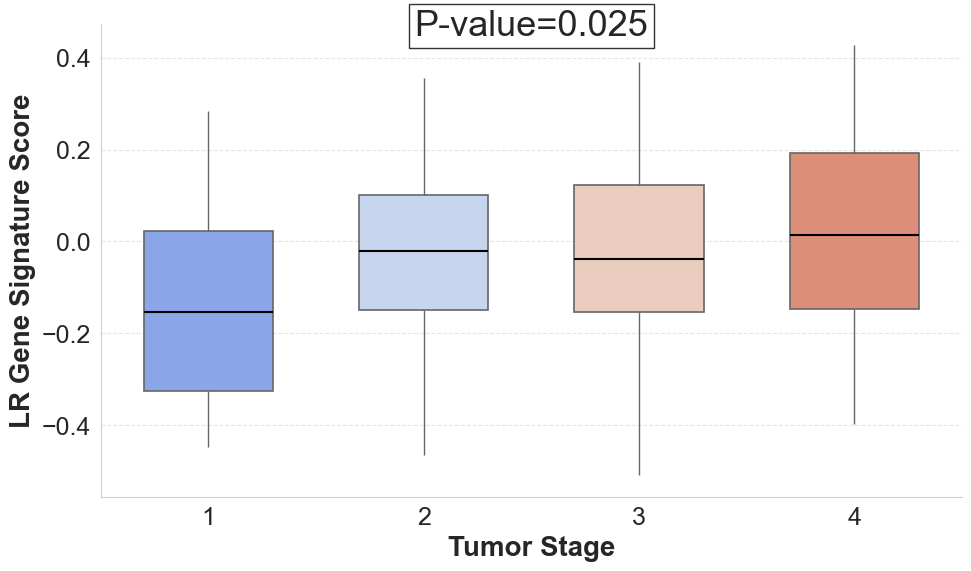

In [51]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats
gsva = pd.read_csv('F:\\pythonproject\\Tensor\\Chunk_v2\\data\\OSSC\\GSVA/OSSC_res_scores.csv')
gsva.index = gsva.iloc[:,0]
gsva = gsva.drop('Unnamed: 0',axis=1)
gsva = gsva.T
merged_data = pd.merge(gsva, df.loc[gsva.index], left_index=True, right_index=True)

sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))

stage_order = [1,2,3,4]
merged_data = merged_data[merged_data['ajcc_pathologic_stage.diagnoses'].isin(stage_order)]
merged_data['ajcc_pathologic_stage.diagnoses'] = pd.Categorical(merged_data['ajcc_pathologic_stage.diagnoses'], 
                                                                categories=stage_order, 
                                                                ordered=True)

ax = sns.boxplot(x='ajcc_pathologic_stage.diagnoses', y='OSSC_relevant_LR_gene', 
                 data=merged_data, palette="coolwarm", width=0.6, showcaps=False, 
                 boxprops={'linewidth': 1.2}, medianprops={'color': 'black', 'linewidth': 1.5})

#sns.stripplot(x='ajcc_pathologic_stage.diagnoses', y='OSSC_relevant_LR_gene', 
#              data=merged_data, color="black", size=5, alpha=0.6, jitter=True)

groups = [merged_data.loc[merged_data['ajcc_pathologic_stage.diagnoses'] == s, 'OSSC_relevant_LR_gene'] for s in stage_order]
stat, p = stats.kruskal(*groups)


plt.text(1.5, max(merged_data['OSSC_relevant_LR_gene']) * 1.05, f'P-value={p:.3f}', 
         ha='center', fontsize=26, bbox=dict(facecolor='white', edgecolor='black', alpha=0.8))

plt.xlabel("Tumor Stage", fontsize=20, fontweight="bold")
plt.ylabel("LR Gene Signature Score", fontsize=20, fontweight="bold")
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(axis='y', linestyle="--", alpha=0.5)


sns.despine()
plt.tight_layout()
#plt.savefig('E:\\NMF\\pic\\fig3\\gsva_advanced.png')
plt.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_3844\2573177000.py:18: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




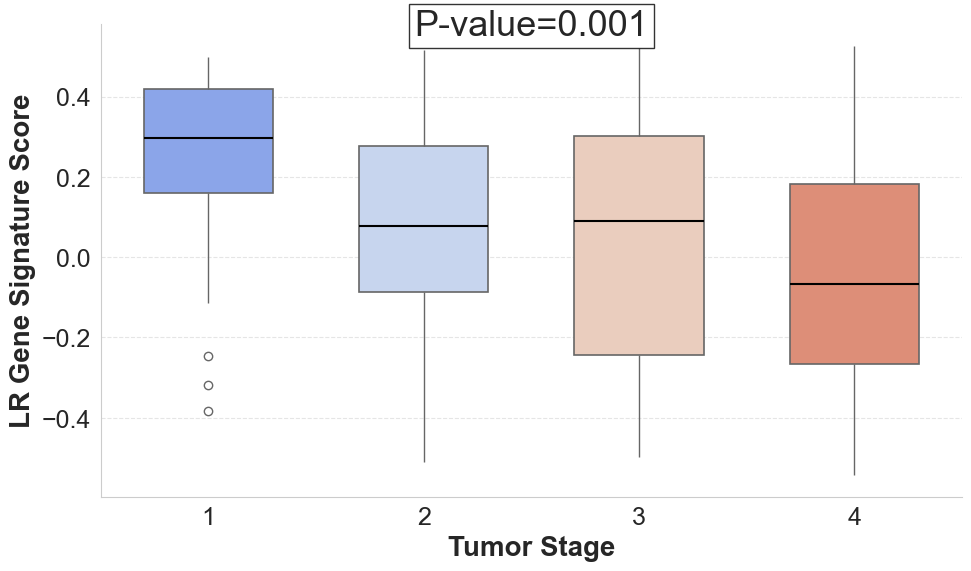

In [54]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats
gsva = pd.read_csv('F:\\pythonproject\\Tensor\\Chunk_v2\\data\\OSSC\\GSVA/OSSC_res2_scores.csv')
gsva.index = gsva.iloc[:,0]
gsva = gsva.drop('Unnamed: 0',axis=1)
gsva = gsva.T
gsva.columns=['OSSC_relevant_LR_gene2']
merged_data = pd.merge(gsva, merged_data.loc[gsva.index], left_index=True, right_index=True)

sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))

stage_order = [1,2,3,4]
merged_data = merged_data[merged_data['ajcc_pathologic_stage.diagnoses'].isin(stage_order)]
merged_data['ajcc_pathologic_stage.diagnoses'] = pd.Categorical(merged_data['ajcc_pathologic_stage.diagnoses'], 
                                                                categories=stage_order, 
                                                                ordered=True)

ax = sns.boxplot(x='ajcc_pathologic_stage.diagnoses', y='OSSC_relevant_LR_gene2', 
                 data=merged_data, palette="coolwarm", width=0.6, showcaps=False, 
                 boxprops={'linewidth': 1.2}, medianprops={'color': 'black', 'linewidth': 1.5})

#sns.stripplot(x='ajcc_pathologic_stage.diagnoses', y='OSSC_relevant_LR_gene2', 
#              data=merged_data, color="black", size=5, alpha=0.6, jitter=True)

groups = [merged_data.loc[merged_data['ajcc_pathologic_stage.diagnoses'] == s, 'OSSC_relevant_LR_gene2'] for s in stage_order]
stat, p = stats.kruskal(*groups)

plt.text(1.5, max(merged_data['OSSC_relevant_LR_gene2']) * 1.05, f'P-value={p:.3f}', 
         ha='center', fontsize=26, bbox=dict(facecolor='white', edgecolor='black', alpha=0.8))


plt.xlabel("Tumor Stage", fontsize=20, fontweight="bold")
plt.ylabel("LR Gene Signature Score", fontsize=20, fontweight="bold")
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(axis='y', linestyle="--", alpha=0.5)

sns.despine()
plt.tight_layout()
#plt.savefig('E:\\NMF\\pic\\fig3\\gsva_early.png')
plt.show()

In [16]:
adata = sc.read_visium('F:\\pythonproject\\Tensor\\Chunk_v2\\data\\OSSC\\GSE208253_RAW\\GSM6339631_s1\\', 
                       count_file='GSM6339631_s1_filtered_feature_bc_matrix.h5',
                       load_images=True)

D:\python\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning:

Variable names are not unique. To make them unique, call `.var_names_make_unique`.

D:\python\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning:

Variable names are not unique. To make them unique, call `.var_names_make_unique`.



In [17]:
sc.pp.calculate_qc_metrics(adata, inplace=True)
sc.pp.filter_genes(adata, min_cells=10)
sc.pp.filter_cells(adata, min_genes=10)
if adata.var_names.duplicated().any():
    adata.var_names_make_unique()
adata = Chunk.counts2log1tpm(adata)
sc.pp.calculate_qc_metrics(adata, inplace=True)

D:\python\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning:

Variable names are not unique. To make them unique, call `.var_names_make_unique`.

D:\python\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning:

Variable names are not unique. To make them unique, call `.var_names_make_unique`.



In [18]:
sample_id = list(adata.uns['spatial'].keys())[0]  
hires_img = adata.uns['spatial'][sample_id]['images']['hires']  
print(hires_img.dtype, hires_img.min(), hires_img.max())#Make sure the data is unit8 level 255
# Convert the image to uint level 255
hires_img = (hires_img * 255).astype(np.uint8)
print(hires_img.dtype, hires_img.min(), hires_img.max())#Make sure the data is unit8 level 255

float32 0.0 0.9098039
uint8 0 232


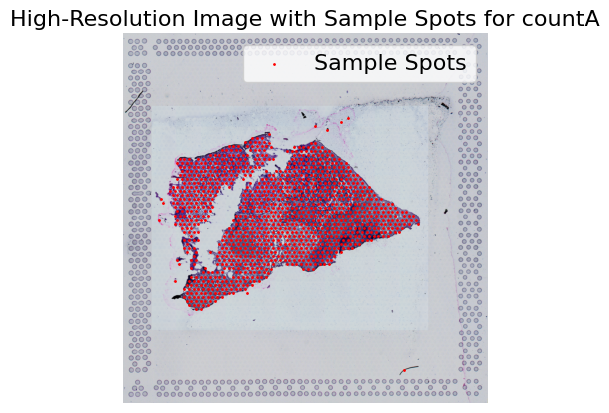

In [19]:
#Set coordinates
x_pixel = np.round(adata.obsm['spatial'][:,1]*adata.uns['spatial'][sample_id]['scalefactors']['tissue_hires_scalef']).astype(int)
y_pixel = np.round(adata.obsm['spatial'][:,0]*adata.uns['spatial'][sample_id]['scalefactors']['tissue_hires_scalef']).astype(int)

#Test coordinates on the image
plt.imshow(hires_img)
plt.scatter(y_pixel, x_pixel, c='red', s=1, label='Sample Spots') 
plt.title(f"High-Resolution Image with Sample Spots for {sample_id}")
plt.axis("off")
plt.legend()
plt.show()

In [20]:
#Calculate adjacent matrix
b=adata.uns['spatial'][sample_id]['scalefactors']['spot_diameter_fullres'] #Diameter of spot
adj=Chunk.calculate_adj_matrix(x=x_pixel,y=y_pixel, x_pixel=x_pixel, y_pixel=y_pixel, image=hires_img, histology=True,beta=b, alpha=1)#
#If histlogy image is not available, SpaGCN can calculate the adjacent matrix using the fnction below
#adj=Chunk.calculate_adj_matrix(x=x_pixel,y=y_pixel, histology=False)
adj = Chunk.create_knn_adj(adj,k=20)
st_lr_expr_df, st_lr_expr_pairs = Chunk.filter_stRNAdata(res, adata)
print("Expression matrix shape:", st_lr_expr_df.shape)
X = Chunk.calculate_correlation_matrix(lr_expr_df, st_lr_expr_df)

Calculateing adj matrix using histology image...
Expression matrix shape: (65, 1182)
|**************************************************|
Performing quality-check for the correlations
The five-number summary of correlations:
Min: -0.15293280178127466
25th Percentile: 0.4566375373800116
Median: 0.5497905076796634
75th Percentile: 0.6258291807529784
Max: 0.844730366676193
|**************************************************|


In [44]:
CCcomm = Chunk.CCcommInfer(method='ordinal',X = X, y = Y, alpha=0, lambda_=0.05, Omega=adj, learning_rate=0.0001, n_epochs=1000)

Epoch [100/1000], Loss: 1.8408
Epoch [200/1000], Loss: 1.8223
Epoch [300/1000], Loss: 1.8075
Epoch [400/1000], Loss: 1.7943
Epoch [500/1000], Loss: 1.7817
Epoch [600/1000], Loss: 1.7696
Epoch [700/1000], Loss: 1.7578
Epoch [800/1000], Loss: 1.7461
Epoch [900/1000], Loss: 1.7346
Epoch [1000/1000], Loss: 1.7232


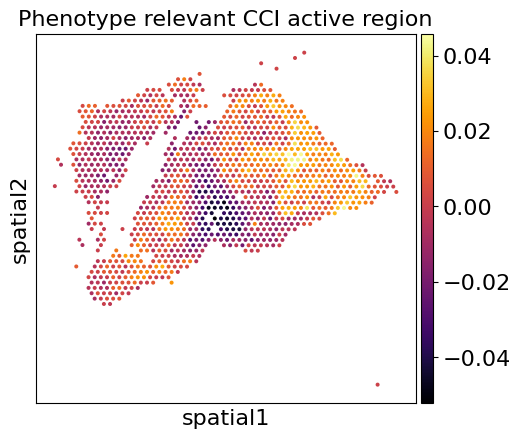

In [22]:
beta = CCcomm.model.linear.weight.detach().cpu().squeeze().numpy()
adata.obs['beta'] = beta
sc.pl.spatial(
    adata,
    img_key=None,
    color='beta',          
    cmap='inferno',        
    spot_size=adata.uns['spatial'][sample_id]['scalefactors']['spot_diameter_fullres'],          
    title="Phenotype relevant CCI active region",  
    colorbar_loc='right',
)

Calculateing adj matrix using xy only...


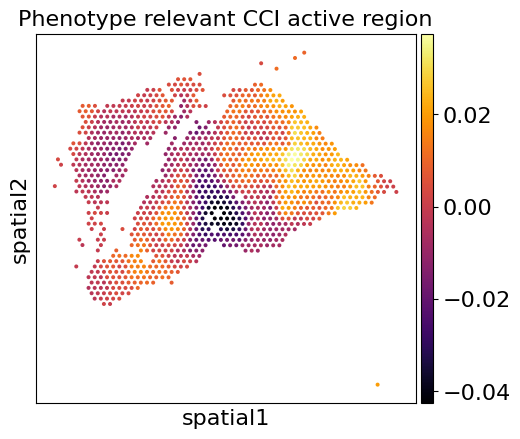

In [25]:
x_array = adata.obs['array_row'].tolist()
y_array = adata.obs['array_col'].tolist()
adj_2d=Chunk.calculate_adj_matrix(x=x_array,y=y_array, histology=False)
adata.obs['refined_beta']=Chunk.refine_beta(sample_id=adata.obs.index.tolist(), pred=adata.obs['beta'].tolist(), dis=adj_2d, shape="hexagon")
sc.pl.spatial(
    adata,
    img_key=None,
    color='refined_beta',          
    cmap='inferno',        #  'viridis', 'plasma', 'inferno' 
    spot_size=adata.uns['spatial'][sample_id]['scalefactors']['spot_diameter_fullres'],        
    title="Phenotype relevant CCI active region", 
    colorbar_loc='right',
)

In [90]:
fontsize = 16
plt.rcParams.update({
    'font.size': fontsize,
    'axes.titlesize': fontsize,
    'axes.labelsize': fontsize,
    'xtick.labelsize': fontsize,
    'ytick.labelsize': fontsize
})

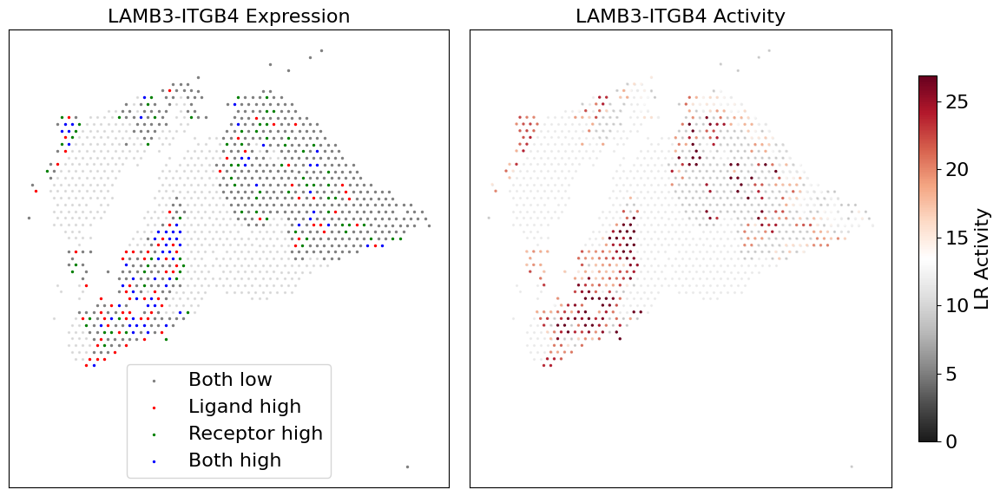

In [26]:
fig = Chunk.plot_Spatiallr(adata=adata, #COL1A1-DDR2 DSC2-DSG1 IL36G-IL36RN MDK-SDC1 LAMB3-ITGB4 COL1A1-ITGA11
    lr_pair=('LAMB3', 'ITGB4'),dual_plot=True)
#plt.savefig('E:\\NMF\\pic\\fig3\\ossc1_LAMB3-ITGB4.png')
plt.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_1120\1535940562.py:7: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata2, resolution=1)


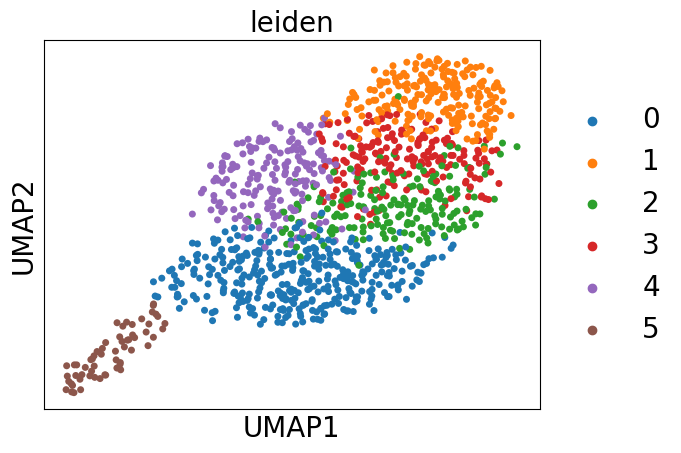

In [42]:
sc.pp.highly_variable_genes(adata, n_top_genes=1500)
adata2 = adata[:, adata.var["highly_variable"]].copy()
sc.pp.scale(adata2, max_value=10)
sc.tl.pca(adata2, svd_solver="arpack")
sc.pp.neighbors(adata2)
sc.tl.umap(adata2)
sc.tl.leiden(adata2, resolution=1)
sc.pl.umap(adata2, color='leiden', title='leiden', show=True)
sc.tl.louvain(adata2)

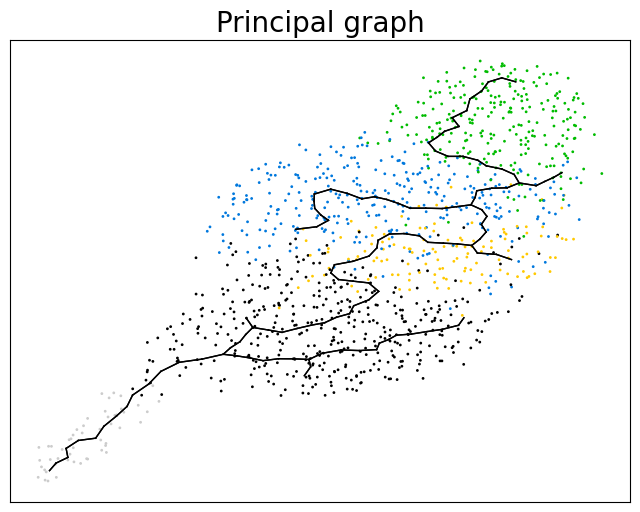

In [43]:
import os
import h5py
import numpy as np
import pandas as pd
from scipy import sparse
from matplotlib import pyplot as plt
from py_monocle import (
    learn_graph,
    order_cells,
    compute_cell_states,
    regression_analysis,
    differential_expression_genes,
)
adata2.X = sparse.csr_matrix(adata2.X)
barcodes = adata2.obs_names.to_numpy()  
features = adata2.var_names.to_numpy()  
data = adata2.X.data  
indices = adata2.X.indices  
indptr = adata2.X.indptr  


umap = adata2.obsm["X_umap"] 
louvain = adata2.obs["louvain"].to_numpy(dtype=int)  
leiden = adata2.obs["leiden"].to_numpy(dtype=int)  

# 重建稀疏矩阵
expression_matrix = sparse.csr_matrix(
    (data, indices, indptr),
    shape=(len(barcodes), len(features))
)
projected_points, mst, centroids = learn_graph(matrix=umap, clusters=leiden)#louvain leiden
pseudotime = order_cells(
    umap, centroids,
    mst=mst,
    projected_points=projected_points,
    root_cells=0,
)
plt.figure(1, (8, 6))
plt.title("Principal graph")
plt.scatter(umap[:, 0], umap[:, 1], c=louvain, s=1, cmap="nipy_spectral")

edges = np.array(mst.nonzero()).T
for edge in edges:
    plt.plot(centroids[edge, 0], centroids[edge, 1], c="black", linewidth=1)
plt.xticks([])
plt.yticks([])
plt.show()

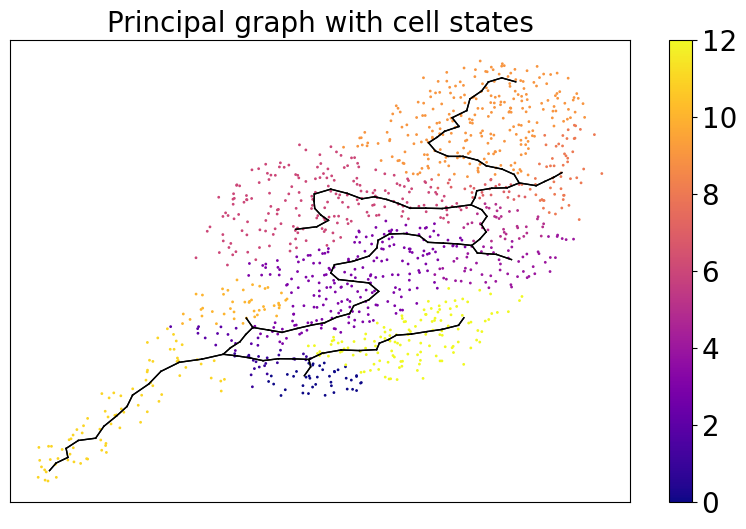

In [44]:
plt.figure(1, (10, 6))
plt.title("Principal graph with cell states")
cell_states, _ = compute_cell_states(umap, centroids, mst)
plt.scatter(umap[:, 0], umap[:, 1], c=cell_states, s=1, cmap="plasma") #nipy_spectral
plt.colorbar()
edges = np.array(mst.nonzero()).T
for edge in edges:
    plt.plot(centroids[edge, 0], centroids[edge, 1], c="black", linewidth=1)
plt.xticks([])
plt.yticks([])
plt.show()

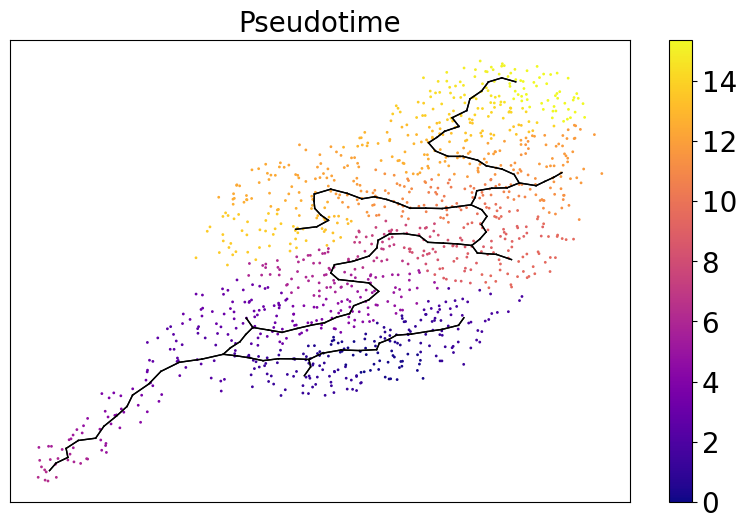

In [45]:
plt.figure(1, (10, 6))
plt.title("Pseudotime")
plt.scatter(umap[:, 0], umap[:, 1], c=pseudotime, s=1, cmap="plasma")
#add edge
edges = np.array(mst.nonzero()).T
for edge in edges:
    plt.plot(centroids[edge, 0], centroids[edge, 1], c="black", linewidth=1)
plt.xticks([])
plt.yticks([])
plt.colorbar()
plt.savefig('E:\\NMF\\pic\\fig3\\ossc1_monocle.png')
plt.show()

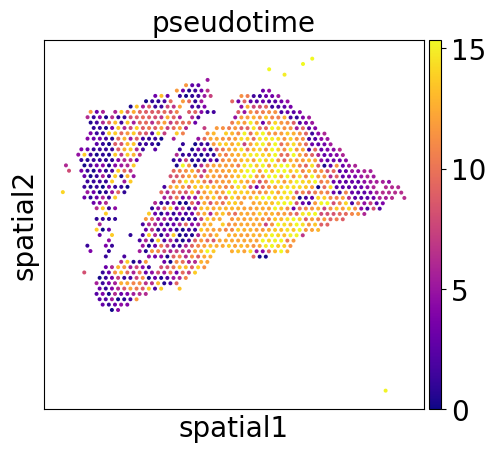

In [46]:
adata.obs['pseudotime'] = pseudotime
sc.pl.spatial(
    adata,
    img_key=None,
    color='pseudotime',          
    cmap='plasma',        
    spot_size=adata.uns['spatial'][sample_id]['scalefactors']['spot_diameter_fullres'],          
    #title="Phenotype relevant CCI active region",  
    colorbar_loc='right',   
    save = 'ossc1_monocle.png'
)

In [88]:
odata = sc.read_loom('E:\\NMF\\GSE208253_RAW\\GSM6339631_s1\\s1_possorted_genome_bam.loom', sparse=True)

D:\python\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [89]:
indexs=[]
for i in odata.obs.index:
    indexs.append(i.split(':')[1].split('x')[0]+'-1')
#odata.obs.index[1].split(':')[1].split('x')[0]+'-1'

In [90]:
adata.obsm['X_spatial'] = np.column_stack((y_pixel, x_pixel))
odata.obs['leiden'] = adata2[indexs,:].obs['leiden'].values
odata.obsm['X_spatial'] = adata[indexs,:].obsm['X_spatial']

In [91]:
odata

AnnData object with n_obs × n_vars = 246 × 33538
    obs: 'leiden'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    obsm: 'X_spatial'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

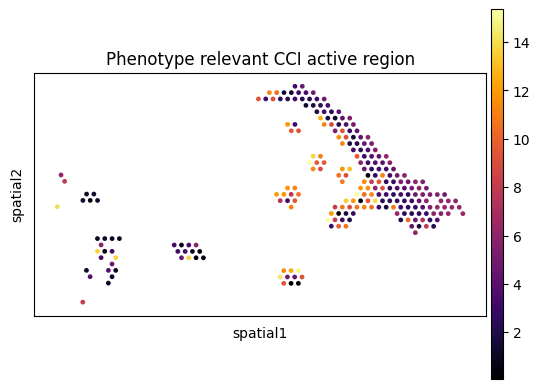

In [92]:
sc.pl.spatial(
    adata[indexs,:],
    img_key=None,
    color='pseudotime',          
    cmap='inferno',        
    spot_size=adata.uns['spatial'][sample_id]['scalefactors']['spot_diameter_fullres'],          
    title="Phenotype relevant CCI active region",  
    colorbar_loc='right'   
)

In [93]:
import scvelo as scv
scv.pp.filter_and_normalize(odata, min_shared_counts=20) 
scv.pp.moments(odata, n_pcs=30, n_neighbors=30)  
scv.tl.velocity(odata, mode="stochastic") 
scv.tl.velocity_graph(odata)  

Filtered out 32815 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Logarithmized X.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/12 cores)


D:\python\Lib\site-packages\scvelo\preprocessing\utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)
C:\Users\Admin\AppData\Local\Temp\ipykernel_3228\1042921918.py:4: DeprecationWarning: Automatic neighbor calculation is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors first with Scanpy.
  scv.pp.moments(odata, n_pcs=30, n_neighbors=30)  # 计算 PCA 和 KNN 以获得平滑的表达数据
D:\python\Lib\site-packages\scvelo\preprocessing\moments.py:71: DeprecationWarning: `neighbors` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors with Scanpy.
  neighbors(
D:\python\Lib\site-packages\scvelo\preprocessing\neighbors.py:233: DeprecationWarning: Automatic computation of PCA is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute PCA

  0%|          | 0/246 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


D:\python\Lib\site-packages\scvelo\plotting\utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
D:\python\Lib\site-packages\scvelo\plotting\utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
D:\python\Lib\site-packages\scvelo\plotting\utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
D:\python\Lib\site-packages\scvelo\plotting\utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstanc

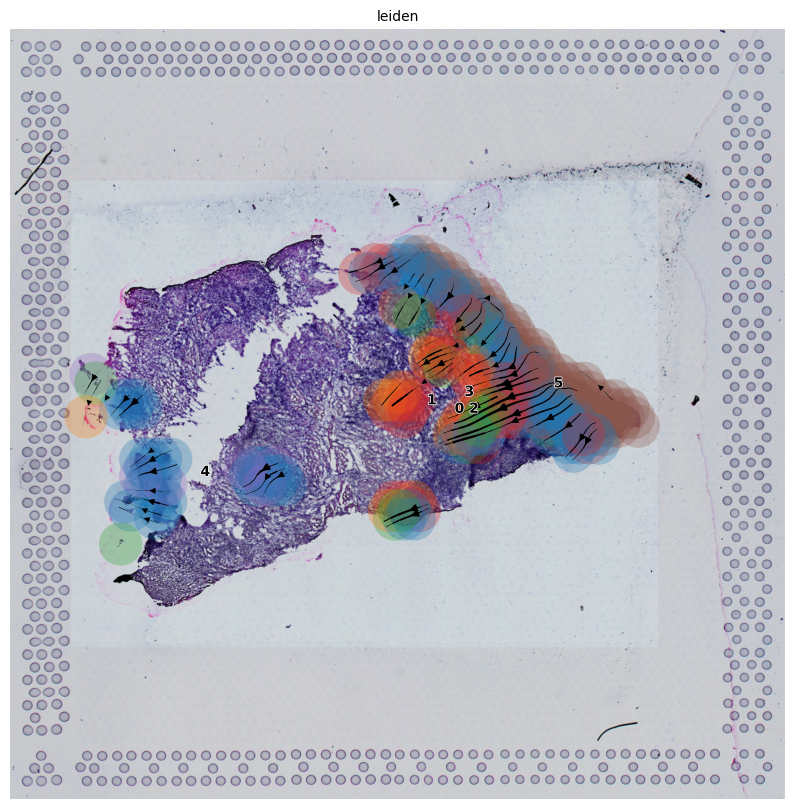

In [95]:
import matplotlib.pyplot as plt
import scvelo as scv

fig, ax = plt.subplots(figsize=(10, 10))

ax.imshow(hires_img, cmap="gray", origin="upper")
odata.obsm["X_spatial"] = odata.obsm["X_spatial"].astype(float)
scv.pl.velocity_embedding_stream(odata, basis="spatial", color="leiden", ax=ax, show=False)

plt.axis("off")
plt.savefig('E:\\NMF\\pic\\fig3\\ossc1_scvelo.png')
plt.show()

In [51]:
adata = sc.read_visium('F:\\pythonproject\\Tensor\\Chunk_v2\\data\\OSSC\\GSE208253_RAW\\GSM6339632_s2\\', 
                       count_file='GSM6339632_s2_filtered_feature_bc_matrix.h5',
                       load_images=True)

D:\python\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
D:\python\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [52]:
sc.pp.calculate_qc_metrics(adata, inplace=True)
sc.pp.filter_genes(adata, min_cells=10)
sc.pp.filter_cells(adata, min_genes=10)
if adata.var_names.duplicated().any():
    adata.var_names_make_unique()
adata = Chunk.counts2log1tpm(adata)
sc.pp.calculate_qc_metrics(adata, inplace=True)

D:\python\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
D:\python\Lib\site-packages\anndata\_core\anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [53]:
sample_id = list(adata.uns['spatial'].keys())[0]  
hires_img = adata.uns['spatial'][sample_id]['images']['hires']  
print(hires_img.dtype, hires_img.min(), hires_img.max())#Make sure the data is unit8 level 255
# Convert the image to uint level 255
hires_img = (hires_img * 255).astype(np.uint8)
print(hires_img.dtype, hires_img.min(), hires_img.max())#Make sure the data is unit8 level 255

float32 0.0 0.92941177
uint8 0 237


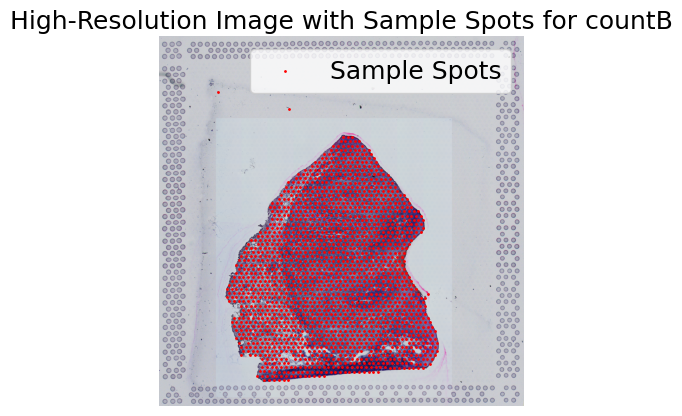

In [54]:
#Set coordinates
x_pixel = np.round(adata.obsm['spatial'][:,1]*adata.uns['spatial'][sample_id]['scalefactors']['tissue_hires_scalef']).astype(int)
y_pixel = np.round(adata.obsm['spatial'][:,0]*adata.uns['spatial'][sample_id]['scalefactors']['tissue_hires_scalef']).astype(int)

plt.imshow(hires_img)
plt.scatter(y_pixel, x_pixel, c='red', s=1, label='Sample Spots') 
plt.title(f"High-Resolution Image with Sample Spots for {sample_id}")
plt.axis("off")
plt.legend()
plt.show()

In [55]:
#Calculate adjacent matrix
b=adata.uns['spatial'][sample_id]['scalefactors']['spot_diameter_fullres'] #Diameter of spot
adj=Chunk.calculate_adj_matrix(x=x_pixel,y=y_pixel, x_pixel=x_pixel, y_pixel=y_pixel, image=hires_img, histology=True,beta=b, alpha=1)#
#If histlogy image is not available, SpaGCN can calculate the adjacent matrix using the fnction below
#adj=Chunk.calculate_adj_matrix(x=x_pixel,y=y_pixel, histology=False)
adj = Chunk.create_knn_adj(adj,k=20)
st_lr_expr_df, st_lr_expr_pairs = Chunk.filter_stRNAdata(res, adata)
print("Expression matrix shape:", st_lr_expr_df.shape)
X = Chunk.calculate_correlation_matrix(lr_expr_df, st_lr_expr_df)

Calculateing adj matrix using histology image...
Expression matrix shape: (66, 1835)
|**************************************************|
Performing quality-check for the correlations
The five-number summary of correlations:
Min: -0.16512558820567594
25th Percentile: 0.5188633963897659
Median: 0.6012410603709567
75th Percentile: 0.665832445299225
Max: 0.8839775688068564
|**************************************************|


In [105]:
CCcomm = Chunk.CCcommInfer(method='ordinal',X = X, y = Y, alpha=0, lambda_=0.05, Omega=adj, learning_rate=0.0001, n_epochs=1000)

Epoch [100/1000], Loss: 1.8276
Epoch [200/1000], Loss: 1.8090
Epoch [300/1000], Loss: 1.7946
Epoch [400/1000], Loss: 1.7818
Epoch [500/1000], Loss: 1.7695
Epoch [600/1000], Loss: 1.7577
Epoch [700/1000], Loss: 1.7460
Epoch [800/1000], Loss: 1.7345
Epoch [900/1000], Loss: 1.7231
Epoch [1000/1000], Loss: 1.7119


In [81]:
fontsize = 18
plt.rcParams.update({
    'font.size': fontsize,
    'axes.titlesize': fontsize,
    'axes.labelsize': fontsize,
    'xtick.labelsize': fontsize,
    'ytick.labelsize': fontsize
})

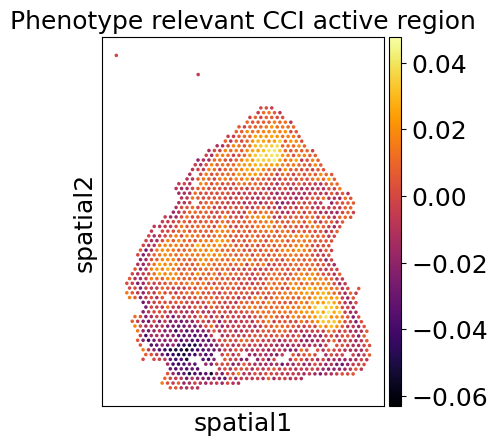

In [61]:
beta = CCcomm.model.linear.weight.detach().cpu().squeeze().numpy()
adata.obs['beta'] = beta
sc.pl.spatial(
    adata,
    img_key=None,
    color='beta',          
    cmap='inferno',        
    spot_size=adata.uns['spatial'][sample_id]['scalefactors']['spot_diameter_fullres'],          
    title="Phenotype relevant CCI active region",  
    colorbar_loc='right',

)

Calculateing adj matrix using xy only...


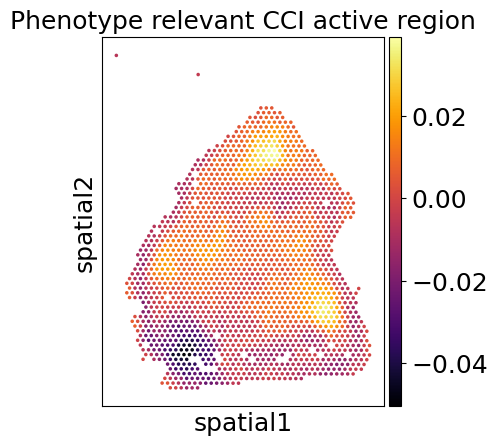

In [62]:
x_array = adata.obs['array_row'].tolist()
y_array = adata.obs['array_col'].tolist()
adj_2d=Chunk.calculate_adj_matrix(x=x_array,y=y_array, histology=False)
adata.obs['refined_beta']=Chunk.refine_beta(sample_id=adata.obs.index.tolist(), pred=adata.obs['beta'].tolist(), dis=adj_2d, shape="hexagon")
sc.pl.spatial(
    adata,
    img_key=None,
    color='refined_beta',          
    cmap='inferno',        #  'viridis', 'plasma', 'inferno' 
    spot_size=adata.uns['spatial'][sample_id]['scalefactors']['spot_diameter_fullres'],        
    title="Phenotype relevant CCI active region", 
    colorbar_loc='right',
    save = 'ossc2.png'
)

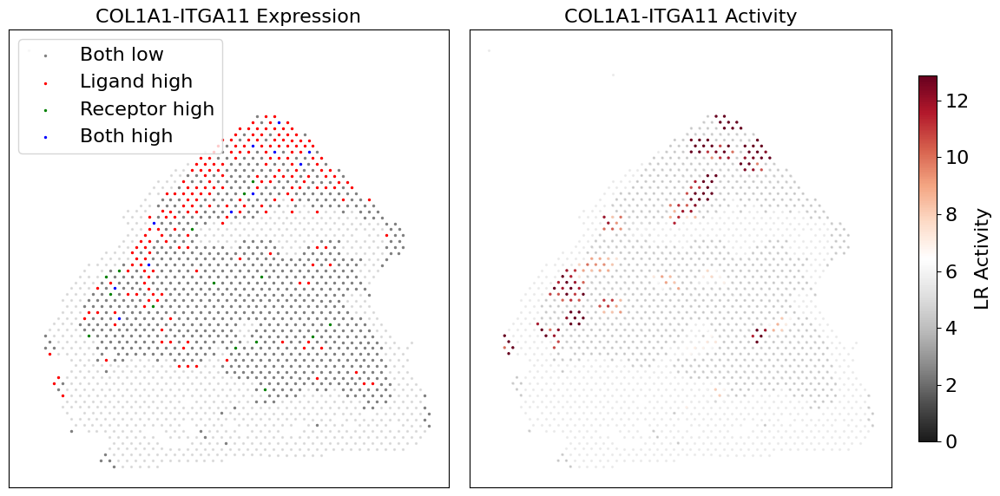

In [74]:
fig = plot_Spatiallr( #COL1A1-DDR2 DSC2-DSG1 IL36G-IL36RN MDK-SDC1 LAMB3-ITGB4 COL1A1-ITGA11
    adata=adata,
    lr_pair=('COL1A1', 'ITGA11'),#
    dual_plot=True
)
plt.savefig('E:\\NMF\\pic\\fig3\\ossc2_COL1A1_ITGA11.png')
plt.show()

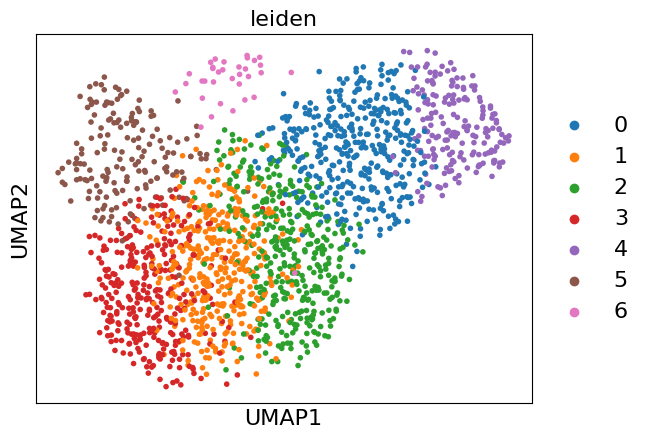

In [75]:
sc.pp.highly_variable_genes(adata, n_top_genes=1500)
adata2 = adata[:, adata.var["highly_variable"]].copy()
sc.pp.scale(adata2, max_value=10)
sc.tl.pca(adata2, svd_solver="arpack")
sc.pp.neighbors(adata2)
sc.tl.umap(adata2)
sc.tl.leiden(adata2, resolution=1)
sc.pl.umap(adata2, color='leiden', title='leiden', show=True)
sc.tl.louvain(adata2)

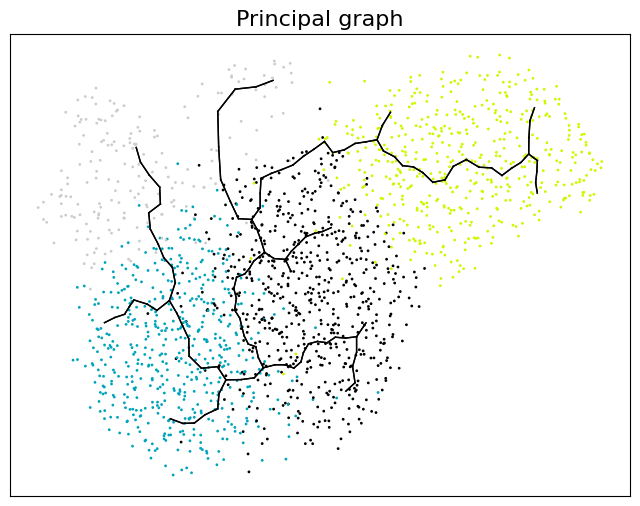

In [76]:
import os
import h5py
import numpy as np
import pandas as pd
from scipy import sparse
from matplotlib import pyplot as plt
from py_monocle import (
    learn_graph,
    order_cells,
    compute_cell_states,
    regression_analysis,
    differential_expression_genes,
)
adata2.X = sparse.csr_matrix(adata2.X)
barcodes = adata2.obs_names.to_numpy()  
features = adata2.var_names.to_numpy()  
data = adata2.X.data  
indices = adata2.X.indices  
indptr = adata2.X.indptr 

umap = adata2.obsm["X_umap"]  
louvain = adata2.obs["louvain"].to_numpy(dtype=int) 
leiden = adata2.obs["leiden"].to_numpy(dtype=int)  

expression_matrix = sparse.csr_matrix(
    (data, indices, indptr),
    shape=(len(barcodes), len(features))
)
projected_points, mst, centroids = learn_graph(matrix=umap, clusters=leiden)#louvain leiden
pseudotime = order_cells(
    umap, centroids,
    mst=mst,
    projected_points=projected_points,
    root_cells=0,
)
plt.figure(1, (8, 6))
plt.title("Principal graph")
plt.scatter(umap[:, 0], umap[:, 1], c=louvain, s=1, cmap="nipy_spectral")

edges = np.array(mst.nonzero()).T
for edge in edges:
    plt.plot(centroids[edge, 0], centroids[edge, 1], c="black", linewidth=1)
plt.xticks([])
plt.yticks([])
plt.show()

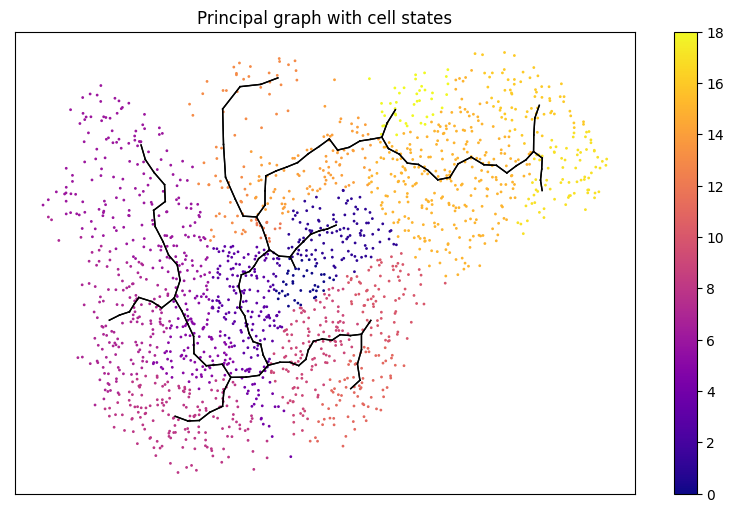

In [123]:
plt.figure(1, (10, 6))
plt.title("Principal graph with cell states")
cell_states, _ = compute_cell_states(umap, centroids, mst)
plt.scatter(umap[:, 0], umap[:, 1], c=cell_states, s=1, cmap="plasma")
plt.colorbar()
edges = np.array(mst.nonzero()).T
for edge in edges:
    plt.plot(centroids[edge, 0], centroids[edge, 1], c="black", linewidth=1)
plt.xticks([])
plt.yticks([])
plt.show()

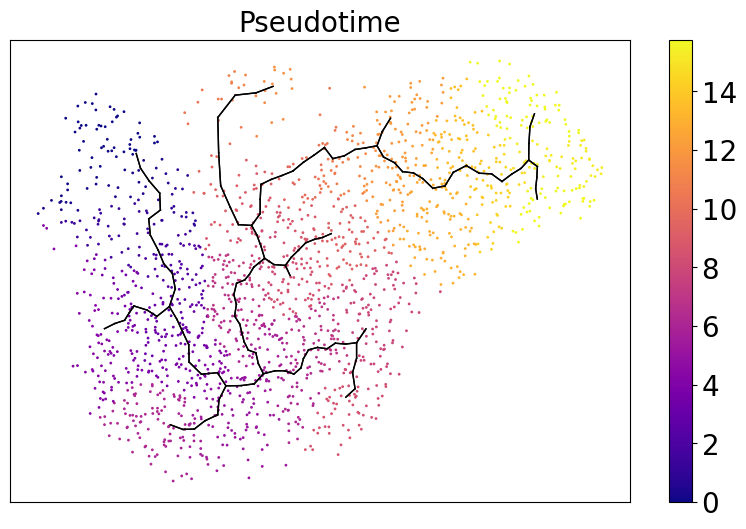

In [79]:
plt.figure(1, (10, 6))
plt.title("Pseudotime")
plt.scatter(umap[:, 0], umap[:, 1], c=pseudotime, s=1, cmap="plasma")
edges = np.array(mst.nonzero()).T
for edge in edges:
    plt.plot(centroids[edge, 0], centroids[edge, 1], c="black", linewidth=1)
plt.xticks([])
plt.yticks([])
plt.colorbar()
#plt.savefig('E:\\NMF\\pic\\fig3\\ossc2_monocle.png')
plt.show()

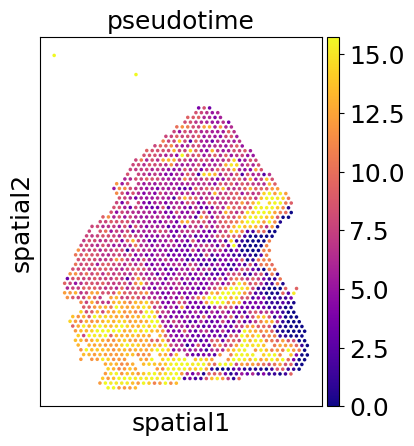

In [82]:
adata.obs['pseudotime'] = pseudotime
sc.pl.spatial(
    adata,
    img_key=None,
    color='pseudotime',          
    cmap='plasma',        
    spot_size=adata.uns['spatial'][sample_id]['scalefactors']['spot_diameter_fullres'],          
    #title="Phenotype relevant CCI active region",  
    colorbar_loc='right',
    save='ossc2_monocle.png'
)

In [127]:
odata = sc.read_loom('E:\\NMF\\GSE208253_RAW\\GSM6339632_s2\\s2_possorted_genome_bam.loom', sparse=True)

In [128]:
indexs=[]
for i in odata.obs.index:
    indexs.append(i.split(':')[1].split('x')[0]+'-1')
#odata.obs.index[1].split(':')[1].split('x')[0]+'-1'

In [129]:
adata.obsm['X_spatial'] = np.column_stack((y_pixel, x_pixel))
odata.obs['leiden'] = adata2[indexs,:].obs['leiden'].values
odata.obsm['X_spatial'] = adata[indexs,:].obsm['X_spatial']

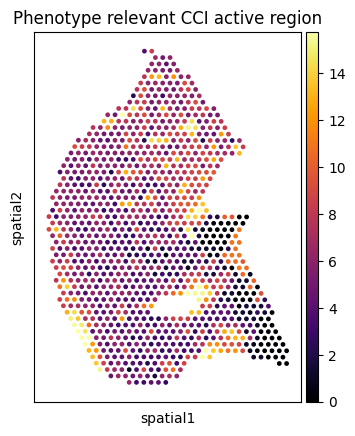

In [130]:
sc.pl.spatial(
    adata[indexs,:],
    img_key=None,
    color='pseudotime',          
    cmap='inferno',        
    spot_size=adata.uns['spatial'][sample_id]['scalefactors']['spot_diameter_fullres'],          
    title="Phenotype relevant CCI active region",  
    colorbar_loc='right'   
)

In [131]:
import scvelo as scv
scv.pp.filter_and_normalize(odata, min_shared_counts=20)
scv.pp.moments(odata, n_pcs=30, n_neighbors=30)  
scv.tl.velocity(odata, mode="stochastic")  
scv.tl.velocity_graph(odata)  

Filtered out 32217 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Logarithmized X.


D:\python\Lib\site-packages\scvelo\preprocessing\utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)
C:\Users\Admin\AppData\Local\Temp\ipykernel_3228\1042921918.py:4: DeprecationWarning: Automatic neighbor calculation is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors first with Scanpy.
  scv.pp.moments(odata, n_pcs=30, n_neighbors=30)  # 计算 PCA 和 KNN 以获得平滑的表达数据
D:\python\Lib\site-packages\scvelo\preprocessing\moments.py:71: DeprecationWarning: `neighbors` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors with Scanpy.
  neighbors(
D:\python\Lib\site-packages\scvelo\preprocessing\neighbors.py:233: DeprecationWarning: Automatic computation of PCA is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute PCA

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/12 cores)


D:\python\Lib\site-packages\scvelo\tools\optimization.py:184: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  gamma[i] = np.linalg.pinv(A.T.dot(A)).dot(A.T.dot(y[:, i]))


  0%|          | 0/1064 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [135]:
odata.obs

,leiden,initial_size_unspliced,initial_size_spliced,initial_size,n_counts,velocity_self_transition
CellID,,,,,,
possorted_genome_bam_IBODB:ACCGCAATAACTGCCTx,3,623.0,8860.0,8860.0,2336.716797,0.276098
possorted_genome_bam_IBODB:AAACCGTTCGTCCAGGx,0,158.0,1784.0,1784.0,2042.461792,0.112565
possorted_genome_bam_IBODB:AACGCGACCTTGGGCGx,2,140.0,1451.0,1451.0,2236.912598,0.104226
possorted_genome_bam_IBODB:AATGACGTAGGATGTCx,0,68.0,641.0,641.0,2152.025146,0.101328
possorted_genome_bam_IBODB:AACTAGGCTTGGGTGTx,3,780.0,9431.0,9431.0,2379.610840,0.091251
...,...,...,...,...,...,...
possorted_genome_bam_IBODB:TTGGATATCGTCTACGx,1,312.0,3556.0,3556.0,2311.228271,0.110731
possorted_genome_bam_IBODB:TTGTGTATGCCACCAAx,3,1037.0,12979.0,12979.0,2414.144287,0.117119
possorted_genome_bam_IBODB:TTCGGTACTGTAGAGGx,3,412.0,6191.0,6191.0,2451.589600,0.261696


D:\python\Lib\site-packages\scvelo\plotting\utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
D:\python\Lib\site-packages\scvelo\plotting\utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
D:\python\Lib\site-packages\scvelo\plotting\utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
D:\python\Lib\site-packages\scvelo\plotting\utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstanc

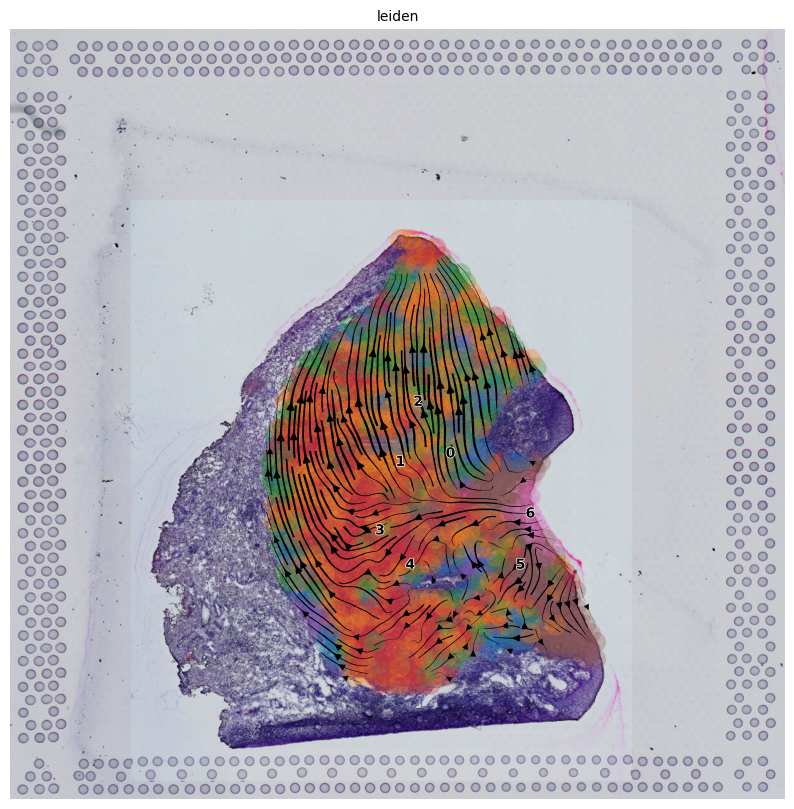

In [133]:
import matplotlib.pyplot as plt
import scvelo as scv

fig, ax = plt.subplots(figsize=(10, 10))

ax.imshow(hires_img, cmap="gray", origin="upper")
odata.obsm["X_spatial"] = odata.obsm["X_spatial"].astype(float)
scv.pl.velocity_embedding_stream(odata, basis="spatial", color="leiden", ax=ax, show=False)
plt.axis("off")
#plt.savefig('E:\\NMF\\pic\\fig3\\ossc2_scvelo.png')
plt.show()